In [32]:
%load_ext autoreload
%autoreload 2
%config Completer.use_jedi = False

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
import pandas as pd
import os
import re
from ast import literal_eval
import numpy as np

pd.set_option('display.max_rows', 250)
pd.set_option('display.max_colwidth', 500)

In [3]:
from heuristics.model.utils import plot_imgs_with_labels, load_images
from heuristics.heuristics import catalog_flag, calculate_text_heuristics

In [4]:
HEUR_IMG_DIR = '/data/heuristics_images/'

In [5]:
dress_room_df = pd.read_csv('/app/heuristics/data/heuristics_dressing_room.csv')

In [6]:
dress_room_df.columns

Index(['image_id_ext', 'item_id_ext', 'microcat_name', 'title', 'description',
       'crop_coords', 'crop_area', 'is_catalog', 'n_texts', 'person_found',
       'perform_top_microcat_value', 'perform_top_microcat_name',
       'perform_top_microcat_prob', 'perform_top_other_classes_value',
       'perform_top_other_classes_prob', 'image'],
      dtype='object')

### Основные поля
'image_id_ext' - id изображения,

'item_id_ext' - id объявления к которому относится изображение,

'title' - заголовок объявления,

'description' - описание объявления,

'microcat_name' - категория объявления,

'image' - сслыка на изображение

### Выходы модели Smart-crop
'crop_coords' - координаты кропа,

'crop_area' - площадь кропа,

'is_catalog' - является ли изображение каталожным,

### Выход модели text_detector
'n_texts' - кол-во областей с текстом на изображении,

### Выход модели по поиску лиц
'person_found' - есть ли человек на изображении

### Выход модели Perform
'perform_top_microcat_value' - предсказание id микрокатегории изображения в виде

'perform_top_microcat_name' - соответствующее название микрокатегории

'perform_top_microcat_prob' - вероятность предсказанной микрокатегории

'perform_top_other_classes_value' - предсказание на другую группу классов

'perform_top_other_classes_prob' - вероятность предсказания

In [7]:
dress_room_df.head(2)[['microcat_name', 'image', 'title', 'description']]

,microcat_name,image,title,description
0,Гардеробные системы и вешалки,http://labelimages.avito.ru/15560973305.jpg,Система хранения,"Система хранения в Санкт-Петербурге и Лен.области с гарантией от завода 10 лет,🚀 \n\n⭐БЕСПЛАТНАЯ ПЛАНИРОВКА⭐ / ⭐МОНТАЖ БЕЗ ПЫЛИ⭐\n\nКаталог вариантов с ценами запросите через сообщение на авито\n Подпишитесь на обновления, чтобы не пропустить еженедельные скидки👇\n \n😎Чем смогу вам помочь:👇\n\n— ✔️Оптимально спланируем элементы гардеробной\n— ✔️Впишемся в ваш бюджет\n— ✔️Профессионально смонтирую (с пылесосом)\n— ✔️Без предоплаты и переплаты\n— ✔️Самовывоз и доставка в удобное время (до 2..."
1,Гардеробные системы и вешалки,http://labelimages.avito.ru/9095886720.jpg,Вешалка для отпаривания,"В хорошем состоянии, удобно одевать брюки. Легко отпаривать одежду с вечера. Для тех, кто не портит своих вещей глажением."


In [19]:
# %%time
# если не тут не скачивается, то лучше взять картинки с гугл диска
# image_paths = load_images(dress_room_df['image'], HEUR_IMG_DIR)

CPU times: user 10.3 s, sys: 8.82 s, total: 19.1 s
Wall time: 11.6 s


In [12]:
dress_room_df['img_path'] = dress_room_df['image_id_ext'].map(
    lambda x: os.path.join(HEUR_IMG_DIR, f'{int(x)}.jpg')
)

## Смотрим на данные

In [13]:
dress_room_df['microcat_name'].value_counts()

Гардеробные системы и вешалки    15150
Name: microcat_name, dtype: int64

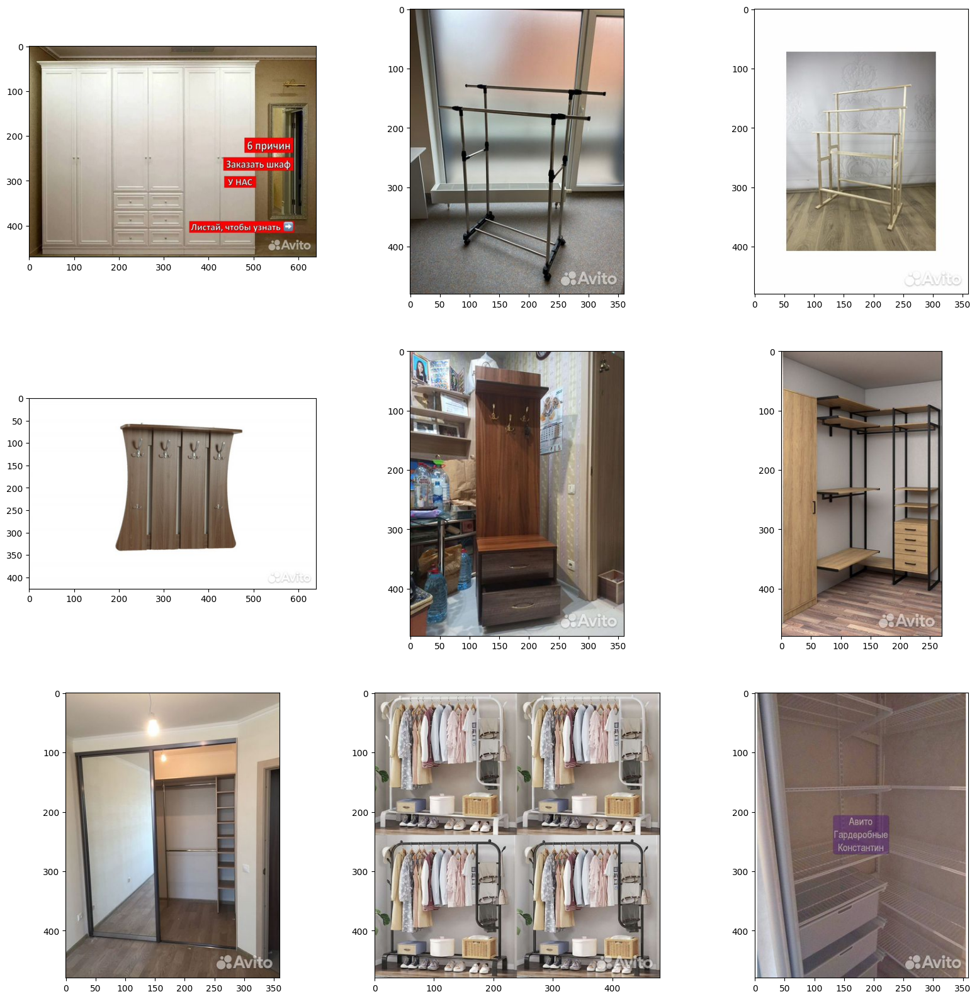

In [14]:
sample_df = dress_room_df.sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

In [15]:
sample_df[['title', 'description']]

,title,description
0,Гардеробная комната,"⚠️Рассрочка 0%\n🔸Изготовим и доставим за 5 дней\n🔸Выезд замерщика с образцами\n🔸Создание 3Dмоделей вашей мебели БЕСПЛАТНО\n📞Звоните прямо сейчас! Работаем без выходных и праздников\n🔸Гарантия 18 месяцев\n🔸Собственное производство, к нам можно записаться на экскурсию\n\nНаши ЦЕНЫ НИЖЕ, чем у конкурентов, потому что мы производим мебель сами, и Вы не переплачиваете посредникам!\n\n✅Проектируем мебель по индивидуальным размерам с шагом 1мм. У нас нет стандартов и наценок за не стандарт\n\n✅Мы в..."
1,Гардеробная,Гардеробная вешалка. В отличном состоянии
2,Вешалка напольная для одежды костюмная деревянная,"Удобная трехсекционная деревянная вешалка для одежды легко впишется в любой интерьер и станет незаменимой для хранения одежды. Костюмы, пиджаки, рубашки и брюки теперь не нужно будет каждый раз убирать в шкаф, а затем гладить.\n\nВся необходимая одежда будет в полном порядке и всегда под рукой благодаря вешалке стойке для вещей. Напольная вешалка оборудована устойчивым основанием и не занимает много места. \n\nСобирается легко и быстро. Фурнитура в комплекте.\n\n— Высота большей стойки: 1..."
3,"Вешалка в прихожую Уют-2, (860х220х820)","Компания ""PapaCarlo"" занимает одну из лидирующих позиций по реализации мебели в Забайкальском крае.\n\nНаши преимущества:\n\n- Всегда только качественная мебель\n\n- Абсолютное соблюдение сроков поставки мебели\n\n- Грамотная помощь специалиста\n\n- Доставка по городу и краю\n\n- Профессиональная сборка мебели\n\n- Гарантия до восьми лет\n\nВешалка Уют-2, (860х220х820)\n\nСостоит из: крючков для сумок и одежды, полки для головных уборов. Изделие симметричное.\n\nВы любите, когда в доме много..."
4,Вешалка для одежды напольная бу деревянная,"Продам трюмо-вешалку за 1500 рублей\n Б/у, в отличном состоянии! Пишите! Самовывоз"
5,Гардеробная система лофт,"😱 Гардеробная система лофт все еще по старой цене! Успей сделать заказ до новых поставок материала.Смотрите другие гардеробы, шкафы и гардеробные комнаты в стиле лофт из металла в нашем каталоге.\n \n📲 Расчет твоего индивидуального заказа за 3 часа. Посчитаем?\n \n✍️Напишите нам слово каталог и мы вышлем подборку мебели в стиле лофт сделанную специально для вас!\n \n💥НА ЗАКАЗ ВОЗМОЖНЫ ЛЮБЫЕ ГАБАРИТЫ, ЦВЕТА ФОРМЫ И МАТЕРИАЛЫ ДЛЯ ВАШЕЙ МЕБЕЛИ В СТИЛЕ ЛОФТ.\n \n🟡🔴⚫️ 25 цветов порошковой краски ..."
6,Гардеробная система,"❗ ГАРДЕРОБ ❗\n \nГaрдероб и мeбeль нa зaкaз в Caнкт - Петербурге от « Невский Мeбeльный Зaвoд »\n \nПoгoнный мeтр oт 17 000 рублей c учeтом cкидки\n\n🔥 Гардероб от производителя, без посредников\n\n❗❗❗ ВАЖНО : при поиске кyхни нa зaказ всегда смoтрите кoличество отзывов и рейтинг аккаунта в Aвито, обычно у посрeдников нет отзывов, тоже самoе и c рeйтингом ❗️❗️❗️\n\nРaботaем кaждый день с 9-00 до 21-00, ЗВOНИТЕ!!!\n \n✔️ чтo входит в стоимость погонного метра :\n \n🔷 Корпуса и фaсaды шкaфов\n..."
7,Вешалка напольная с отсеком для брюк,"Напольная вешалка с отсеком для брюк\n✅Черная/белая\n☑️Размеры подробно на фото в объявлении\n✅При покупке от 2шт цена 1600шт\nЦена за шт 1950р\n☑️Самовывоз/ Доставка\n🚚Отправлю в другой город (Находимся в Челябинске)\nЗаходите в профиль, все для организации пространства 🙌"
8,Гардеробная Титан,"Гардеробная Титанв Санкт-Петербурге,💎 \n\nСрочно нужно решить вопрос с хранением вещей? Сроки и бюджет сжаты? Я знаю, как помочь! \n\n⚡Я продаю системы хранения по цене производителя – отдельно (самовывоз, доставка) и с монтажом под ключ.\n\n⭐ОБО МНЕ \n\nМне важно понять потребность заказчика и предлождить подходящий вариант, оптимальный по планировке и цене. Материалы у всех одинаковые, люди – разные! \n\n— 1. Сформировавшийся мастер: 35 лет. Образование – высшее инженерное. Стаж с 2014 ..."


## Регулярки

In [16]:
regexp1 = re.compile(r'.')

include_re = [regexp1]

not_regexp1 = re.compile(r'заказ')
not_regexp2 = re.compile(r'вешалк')
not_regexp3 = re.compile(r'вешало')

exclude_re = [not_regexp1, not_regexp2, not_regexp3]

In [17]:
dress_room_df = calculate_text_heuristics(dress_room_df, include_re, exclude_re=exclude_re)

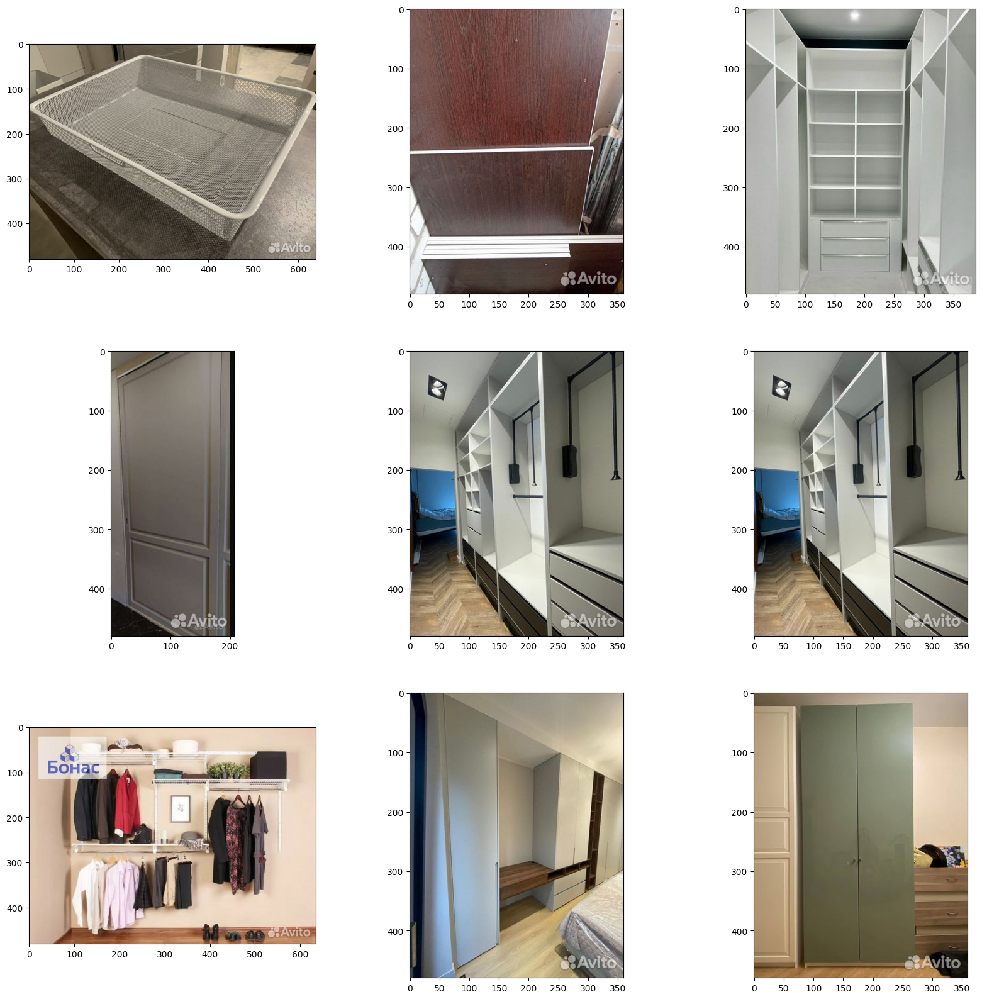

In [18]:
sample_df = dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1)].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

In [19]:
sample_df[['title', 'description']]

,title,description
0,Корзина Titan 85мм Paks,Корзина Пакс белая мелкосетчатая с ручкой для гардеробной модульной системы Титан. \n410х85х534мм \nНовые абсолютно. \nВ наличии 11шт.\n\nМаксимальная равномерно распределенная нагрузка до 15 кг\nЦвет: белый (RAL 9016)\nCрок службы: 10 лет
1,Гардеробная.без дверок высота 2.30ширина 58см,Состояние хорошее.
2,Гардеробная система новая,"Функциональная гардеробная напрямую с фабрики в Екатеринбурге! \n\nОт замера до монтажа всего 10-14 дней⏰👍🏻 Создаем как маленькие, так и большие гардеробные с любым наполнением 😎\n\n🔹 Позвоните или напишите нам для записи на БЕСПЛАТНЫЙ замер или получения консультации и расчёта стоимости вашего шкафа! 🔹\n\nКаждый проект ведём индивидуально, опыт работы более 12 лет! 🛠\n\n✅ Цена ниже, чем в мебельных салонах, на 20-30% (работаем без посредников)\n\n✅ Рассрочка платежа на 3/6/10/12 месяцев\n\n..."
3,Двери купе в гардеробную 2490*980,Фасад МДФ для шкаф-купе или дверь гардеробной размер 2490*980 см цвет мокко (кофе с молоком).
4,Гардеробная шкаф дизайнерский,"DIZAINAZONA - это про стиль, качество и комфорт. Топовый производитель мебели полного цикла с Риги.\n \nИменно нам вы можете доверить:\n \n- прихожую, которая как визитная карточка, покажет ваш стиль\n \n- идеально встроенный шкаф или отдельно стоящий, как искусство\n \n- рабочее место, за которым всё удобно расположено под рукой\n \n- гардеробную мечты, где у каждой вещи будет своë место\n \n- детскую, из которой ребёнок не захочет выходить\n \nПроработаем дизайн, 3D-проект, подберем матери..."
5,Гардеробная шкаф дизайнерский,"DIZAINAZONA - это про стиль, качество и комфорт. Топовый производитель мебели полного цикла с Риги.\n \nИменно нам вы можете доверить:\n \n- прихожую, которая как визитная карточка, покажет ваш стиль\n \n- идеально встроенный шкаф или отдельно стоящий, как искусство\n \n- рабочее место, за которым всё удобно расположено под рукой\n \n- гардеробную мечты, где у каждой вещи будет своë место\n \n- детскую, из которой ребёнок не захочет выходить\n \nПроработаем дизайн, 3D-проект, подберем матери..."
6,Гардеробная,"Гардеробная\n\n🔥 ГАРАНТИРУЕМ ЛУЧШУЮ ЦЕНУ 🔥\n\nГардеробная система Титан-GS– это удобное и функциональное решение для хранения вещей в различных помещениях. \n\nПодготавливаем проект гардеробной по индивидуальным размерам помещения - БЕСПЛАТНО. \n\n❗️Звоните и получайте самую выгодную цену❗️\n\n ___\n\n📍БОНАС - магазин активно работающий на рынке металлической мебели с 2015 года. Нашим клиентам мы предлагаем современные и удобные решения для организации мест хранения в домах, квартирах, подсо..."
7,Гардеробный шкаф дизайнерский,"DIZAINAZONA - это про стиль, качество и комфорт. Топовый производитель мебели полного цикла с Риги.\n \nИменно нам вы можете доверить:\n \n- прихожую, которая как визитная карточка, покажет ваш стиль\n \n- идеально встроенный шкаф или отдельно стоящий, как искусство\n \n- рабочее место, за которым всё удобно расположено под рукой\n \n- гардеробную мечты, где у каждой вещи будет своë место\n \n- детскую, из которой ребёнок не захочет выходить\n \nПроработаем дизайн, 3D-проект, подберем матери..."
8,Шкаф гардероб,"Шкаф для одежды, в идеальном состоянии. Минимум следов бытового использования. Без царапин и сколов.\nКрасивый зеленый цвет, глянцевые двери.\nВ комплекте выдвижная полка ( 1 шт), полка ( 1 шт) и перекладина (1 шт).\n\nСамовывоз, в разборке поможем.\n\nШирина 100\nГлубина 60\nВысота 236"


# Внешние данные - модели

## 1. Perform

In [20]:
dress_room_df[['image', 'perform_top_microcat_name', 'perform_top_microcat_prob', 
               'perform_top_other_classes_value', 'perform_top_other_classes_prob']]

,image,perform_top_microcat_name,perform_top_microcat_prob,perform_top_other_classes_value,perform_top_other_classes_prob
0,http://labelimages.avito.ru/15560973305.jpg,Для магазина,0.709483,Скриншоты переписок,0.006964
1,http://labelimages.avito.ru/9095886720.jpg,Для магазина,0.730528,Порнография,0.183122
2,http://labelimages.avito.ru/15560972592.jpg,Для магазина,0.862651,Скриншоты переписок,0.010626
3,http://labelimages.avito.ru/15560975623.jpg,Для магазина,0.827360,Порнография,0.007064
4,http://labelimages.avito.ru/15629461405.jpg,Для магазина,0.198021,Дети,0.027464
...,...,...,...,...,...
15145,http://labelimages.avito.ru/15941249740.jpg,Книги,0.185877,Свастика,0.046759
15146,http://labelimages.avito.ru/15941479187.jpg,Книги,0.185877,Свастика,0.046759
15147,http://labelimages.avito.ru/16038596428.jpg,Видеокамеры,0.062653,Ванная,0.027625
15148,http://labelimages.avito.ru/16038609701.jpg,Видеокамеры,0.121906,Скриншоты переписок,0.021699


In [21]:
dress_room_df['perform_top_microcat_name'].value_counts()[:10]

Шкафы, комоды и стеллажи      6641
Другое                        3395
Ресепшены и офисная мебель    1253
Для магазина                   825
Подставки и тумбы              376
Двери                          256
Наушники                       243
Детская мебель                 232
Потолки                        125
Кухонные гарнитуры             120
Name: perform_top_microcat_name, dtype: int64

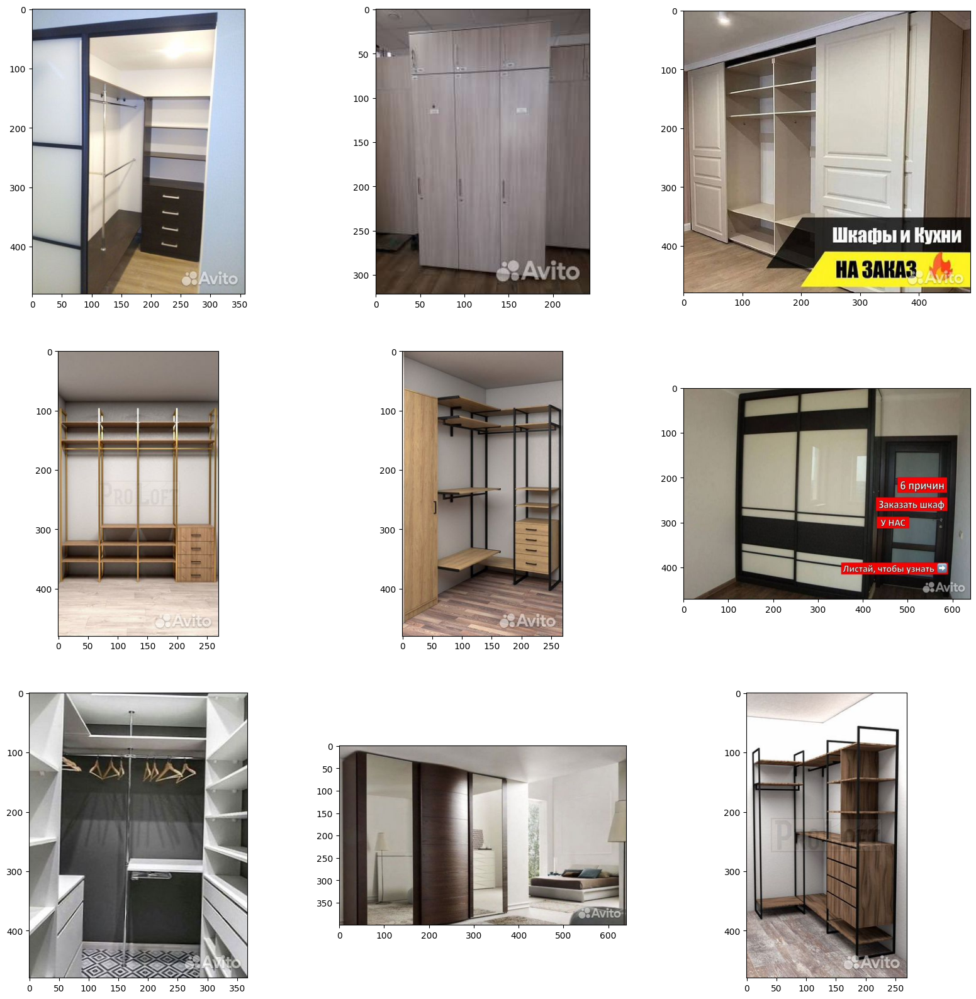

In [22]:
sample_df = dress_room_df[(dress_room_df['perform_top_microcat_name'] == 'Шкафы, комоды и стеллажи') & (
    dress_room_df['perform_top_microcat_prob'] >= 0.1)].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

## 2. Text detector 
Определяет область с текстом на картинке

Мы будем просто считать кол-во таких областей

In [23]:
dress_room_df['n_texts'].value_counts()

1     7644
0     3629
2      834
4      566
3      491
8      374
5      365
9      256
7      249
6      186
14     101
19      83
16      54
21      52
10      44
23      36
20      32
15      31
13      26
22      22
12      14
11      14
18      10
17       7
95       5
24       5
27       3
25       2
32       2
28       2
34       1
35       1
31       1
26       1
39       1
30       1
42       1
60       1
29       1
43       1
54       1
Name: n_texts, dtype: int64

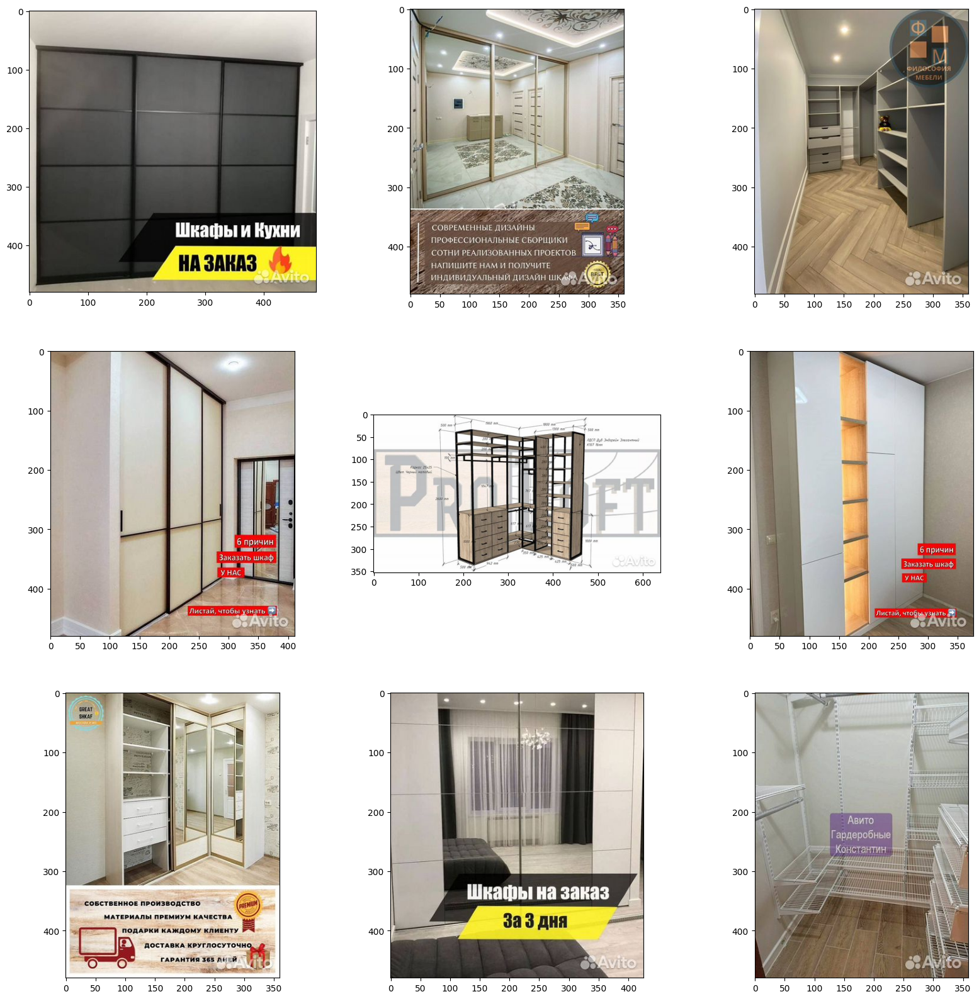

In [24]:
sample_df = dress_room_df[dress_room_df['n_texts'] >= 3].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

## 3. Smart crop

In [25]:
dress_room_df[['crop_coords', 'crop_area', 'is_catalog']]

,crop_coords,crop_area,is_catalog
0,"[0.1919984370470047, 0.0204620361328125, 0.9016428589820862, 0.98046875]",0.681263,False
1,"[0.27001953125, 0.025390625, 0.7099609375, 0.92578125]",0.396119,False
2,"[0.10186673700809479, 0.022796630859375, 0.8873000144958496, 0.9833984375]",0.754489,False
3,"[0.12142515182495117, 0.038665771484375, 0.9772687554359436, 0.87353515625]",0.714518,False
4,"[0.281494140625, 0.02766927145421505, 0.80615234375, 0.978515625]",0.498869,False
...,...,...,...
15145,"[0.349609375, 0.1044921875, 0.6259765625, 0.9129464626312256]",0.223430,True
15146,"[0.349609375, 0.1044921875, 0.6259765625, 0.9129464626312256]",0.223430,True
15147,"[0.14234213531017303, 0.0269775390625, 0.9417175054550171, 0.92041015625]",0.714188,False
15148,"[0.14446131885051727, 0.0284423828125, 0.9351022839546204, 0.93310546875]",0.715264,False


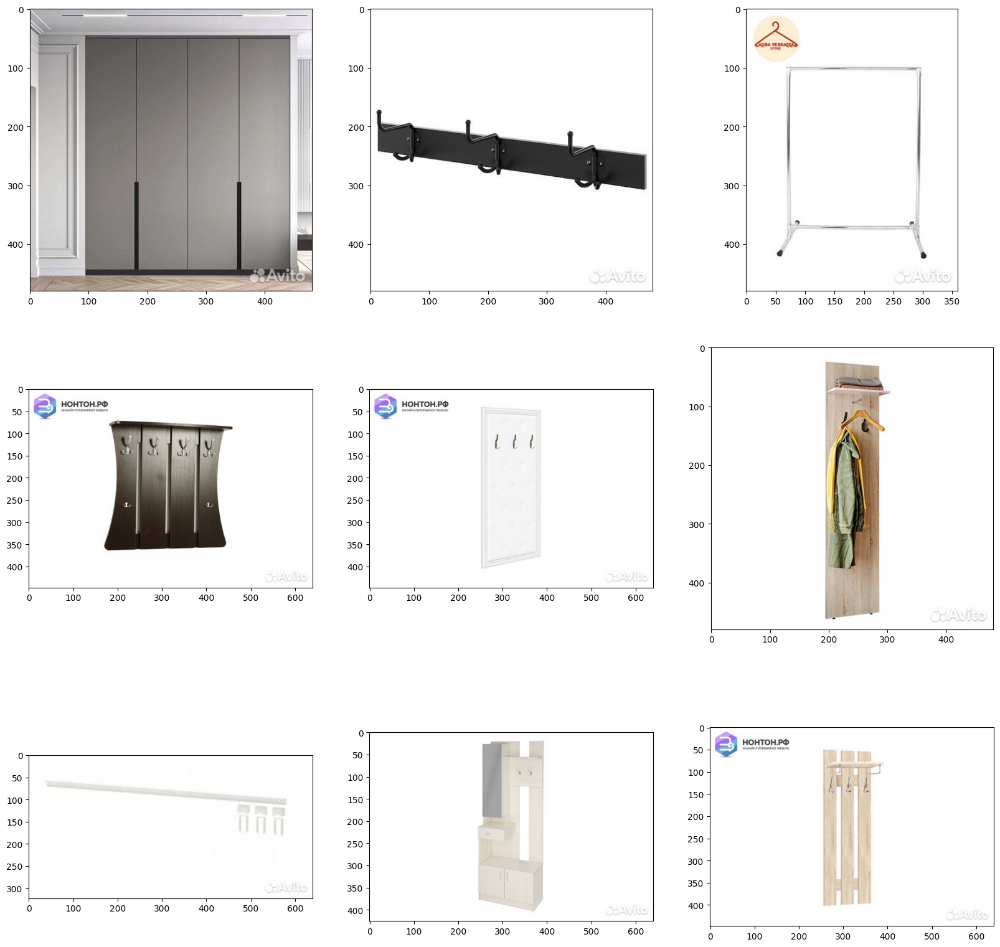

In [27]:
sample_df = dress_room_df[dress_room_df['is_catalog'] == True].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

## Модель распознавания лиц

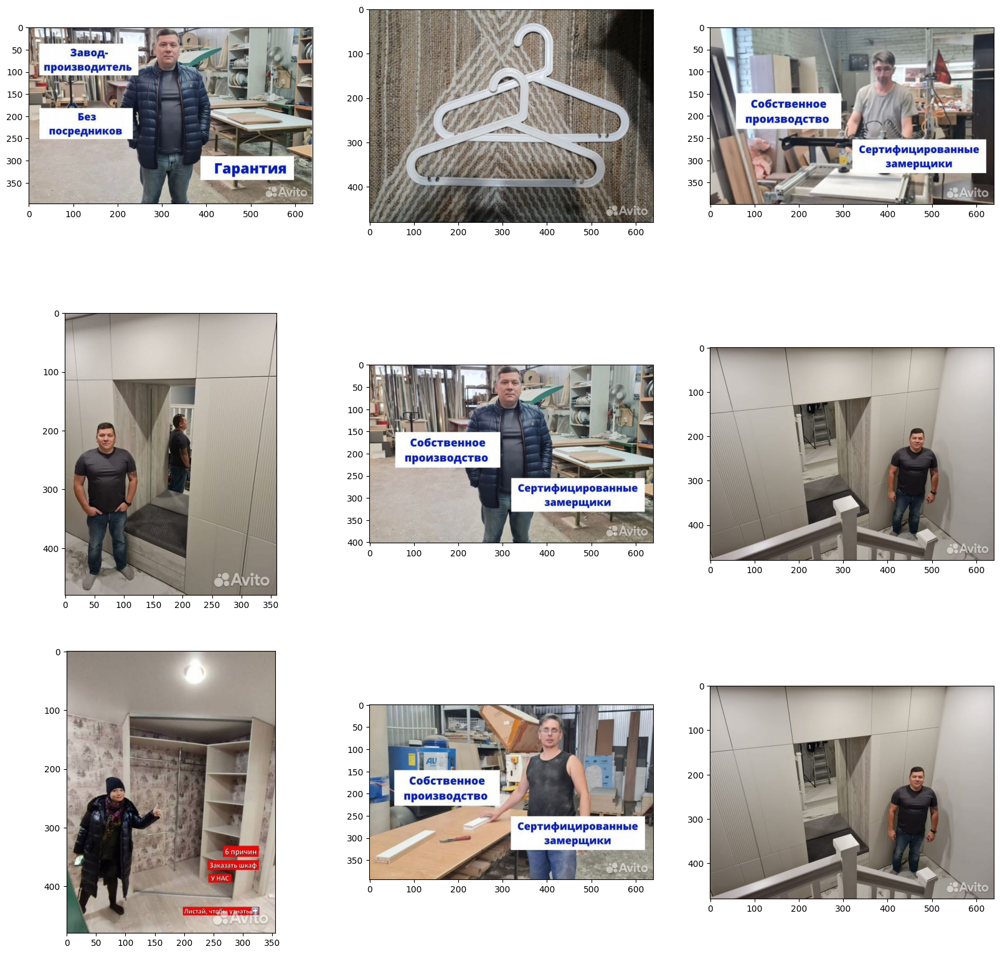

In [28]:
sample_df = dress_room_df[dress_room_df['person_found'] == True].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

In [29]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1)].shape

(1375, 19)

In [30]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False)].shape

(1149, 19)

In [31]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False
                                        ) & (dress_room_df['person_found'] == False)].shape

(1134, 19)

In [120]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False)
             ].to_csv('/app/heuristics/data/heur_dress_room.csv', index=False)

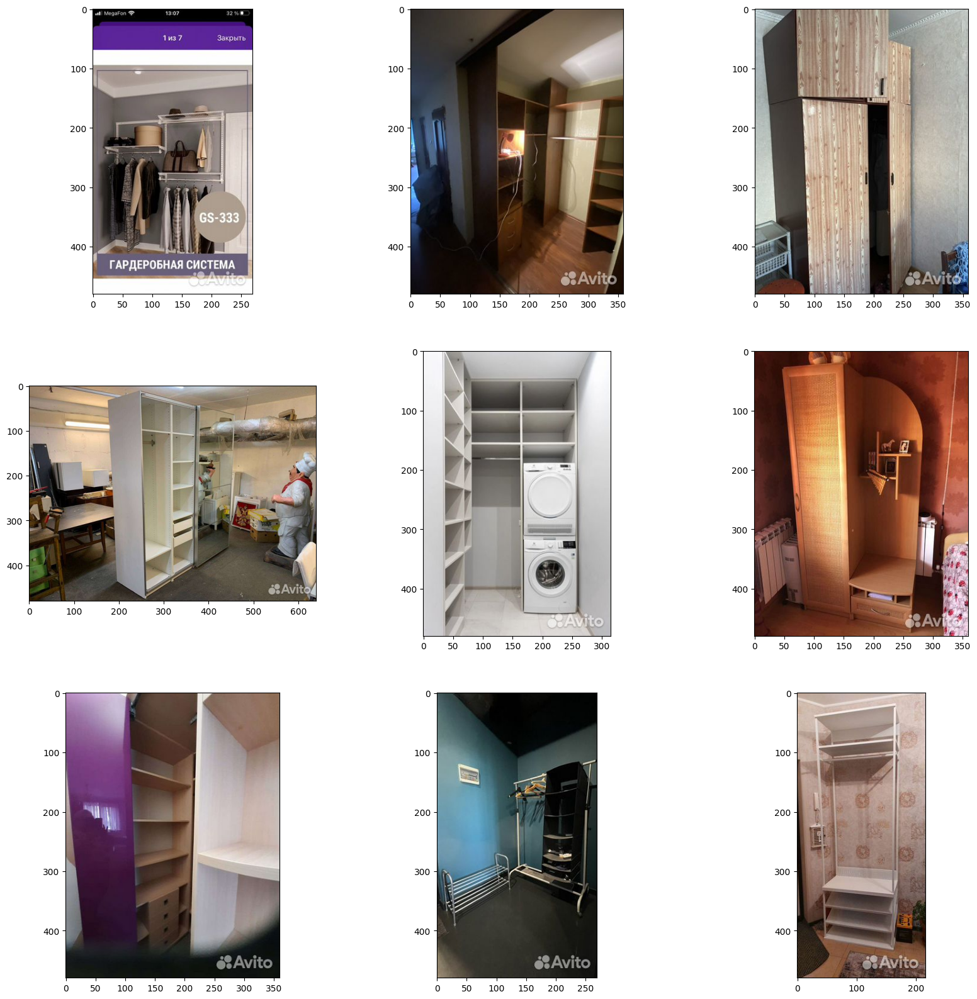

In [173]:
sample_df = dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False
                                        ) & (dress_room_df['person_found'] == False)].sample(9).reset_index()

plot_imgs_with_labels(sample_df['img_path'])